# Install Detectron2 Dependencies

In [1]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8 MB 13 kB/s 
     |████████████████████████████████| 6.6 MB 24.8 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.12.1+cu113
    Uninstalling torch-1.12.1+cu113:
      Successfully uninstalled torch-1.12.1+cu113
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.13.1+cu113
    Uninstalling torchvision-0.13.1+cu113:
      Successfully uninstalled torchvision-0.13.1+cu113
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.13.1 requires torch==1.12.1, but you have torch 1.5.0+cu101 which is incompatible.
torchaudio 0.12.1+cu113 requires torch==1.12.1, but you have torch 1.5.0+cu101

In [2]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.3 MB 365 kB/s 
     |████████████████████████████████| 50 kB 6.6 MB/s 
     |████████████████████████████████| 42 kB 1.1 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221122-py3-none-any.whl size=61484 sha256=3e0198d80b28b77cd1adf54e03f005728c9117bfa6056940054f12732611da1a
  Stored in directory: /root/.cache/pip/wheels/15/6e/e3/602889ca9c5c55020f8d205066445ac5b1b96df59f75170ca0
  Created wheel for iopath: filename=iopath-0.1.10-py3-none-any.whl size=31547 sha256=9bffbd3fc31ac5c39a48288d98bd9c600a5f80256de95e82246a304f4b40764d
  Stored in directory: /root/.cache/pip/wheels/89/3e/24/0f349c0b2eeb6965903035f3b00dbb5c9bea437b4a2f18d82c
Successfully built fvcore iopath


In [3]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

# Import and Register Custom Detectron2 Data

In [4]:
!curl -L "https://universe.roboflow.com/ds/09OMqjBbKJ?key=FIMDtKHt1N" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   892  100   892    0     0    356      0  0:00:02  0:00:02 --:--:--   356
100 9180k  100 9180k    0     0  1780k      0  0:00:05  0:00:05 --:--:-- 6031k
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/_annotations.coco.json  
 extracting: test/brush12_jpg.rf.8cff986dce6ea9936d34a29bae49acc1.jpg  
 extracting: test/brush25_jpg.rf.6c20e93697dbe8fbdb2d74bf63349b0e.jpg  
 extracting: test/brush2_jpg.rf.a5fe6fcd0db507360bb4f2c33ac9f5b8.jpg  
 extracting: test/brush46_jpg.rf.0bc52043974fef4b3d78f24fdaaf4128.jpg  
 extracting: test/brush8_jpg.rf.dab916a33758cd1a872b3a2ab2538472.jpg  
   creating: train/
 extracting: train/_annotations.coco.json  
 extracting: train/brush11_jpg.rf.20cdd825d61d62d318bf8ee9673d5986.jpg  
 extracting: train/brush11_j

In [5]:
#edit directories for dataset saving
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


WARNING [12/06 09:05:48 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/06 09:05:48 d2.data.datasets.coco]: Loaded 84 images in COCO format from /content/train/_annotations.coco.json


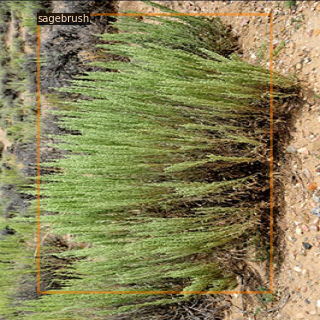

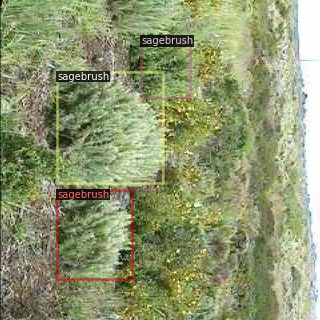

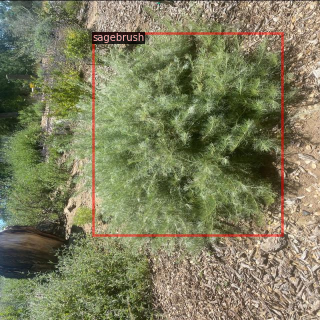

In [6]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Train Custom Detectron2 Detector

In [7]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [8]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 16
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2 #your number of classes + 1

#all epochs set to 530 moving forward for fair comparison with other models...
cfg.TEST.EVAL_PERIOD = 530


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[12/06 09:05:54 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [08:53, 789kB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[12/06 09:14:53 d2.engine.train_loop]: Starting training from iteration 0
[12/06 09:15:29 d2.utils.events]:  eta: 0:45:36  iter: 19  total_loss: 2.083  loss_cls: 1.003  loss_box_reg: 0.957  loss_rpn_cls: 0.100  loss_rpn_loc: 0.015  time: 1.8231  data_time: 0.0324  lr: 0.000020  max_mem: 7203M
[12/06 09:16:08 d2.utils.events]:  eta: 0:45:35  iter: 39  total_loss: 1.951  loss_cls: 0.764  loss_box_reg: 0.993  loss_rpn_cls: 0.118  loss_rpn_loc: 0.016  time: 1.8736  data_time: 0.0140  lr: 0.000040  max_mem: 7203M
[12/06 09:16:49 d2.utils.events]:  eta: 0:46:41  iter: 59  total_loss: 1.698  loss_cls: 0.610  loss_box_reg: 1.018  loss_rpn_cls: 0.077  loss_rpn_loc: 0.013  time: 1.9323  data_time: 0.0099  lr: 0.000060  max_mem: 7203M
[12/06 09:17:28 d2.utils.events]:  eta: 0:46:02  iter: 79  total_loss: 1.533  loss_cls: 0.518  loss_box_reg: 0.980  loss_rpn_cls: 0.061  loss_rpn_loc: 0.011  time: 1.9459  data_time: 0.0142  lr: 0.000080  max_mem: 7203M
[12/06 09:18:08 d2.utils.events]:  eta: 0:45:2

In [9]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output
#output results to WandB
!pip install wandb
import wandb
wandb.login()
wandb.init(sync_tensorboard=True)

<IPython.core.display.Javascript object>

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.9 MB 32.7 MB/s 
     |████████████████████████████████| 182 kB 73.0 MB/s 
     |████████████████████████████████| 168 kB 73.9 MB/s 
     |████████████████████████████████| 62 kB 1.5 MB/s 
     |████████████████████████████████| 168 kB 76.1 MB/s 
     |████████████████████████████████| 166 kB 72.3 MB/s 
     |████████████████████████████████| 166 kB 53.7 MB/s 
     |████████████████████████████████| 162 kB 81.2 MB/s 
     |████████████████████████████████| 162 kB 73.5 MB/s 
     |████████████████████████████████| 158 kB 78.4 MB/s 
     |████████████████████████████████| 157 kB 81.5 MB/s 
     |████████████████████████████████| 157 kB 77.0 MB/s 
     |████████████████████████████████| 157 kB 75.2 MB/s 
     |████████████████████████████████| 157 kB 66.7 MB/s 
     |████████████████████████████████| 157 kB 78.4 MB/s 
     |███████████████████████████

ERROR:wandb.jupyter:Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 

··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: nathanielrivas. Use `wandb login --relogin` to force relogin


In [10]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [12/06 10:06:31 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/06 10:06:31 d2.data.datasets.coco]: Loaded 5 images in COCO format from /content/test/_annotations.coco.json
[12/06 10:06:31 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
| sagebrush  | 0            | sagebrush  | 9            |
|            |              |            |              |
|   total    | 9            |            |              |
[12/06 10:06:31 d2.data.common]: Serializing 5 elements to byte tensors and concatenating them all ...
[12/06 10:06:31 d2.data.common]: Serialized dataset takes 0.00 MiB
[12/06 10:06:31 d2.evaluation.evaluator]: Start inference on 5 images
[12/06 10:06:32 d2.evaluation.evaluator]: Total inference time: 0:00:00.331622 (0.331622 s / img per device, on 1 devices)
[12/06 10:06:3

OrderedDict([('bbox',
              {'AP': 14.375294672324374,
               'AP50': 30.55162659123054,
               'AP75': 15.51155115511551,
               'APs': nan,
               'APm': 23.465346534653463,
               'APl': 15.821782178217816,
               'AP-sagebrush': 14.375294672324374})])

# Inference with Detectron2 Saved Weights



In [11]:
%ls ./output/

coco_instances_results.json                       last_checkpoint
events.out.tfevents.1670317559.7b18885716f5.75.0  metrics.json
instances_predictions.pth                         model_final.pth


In [12]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

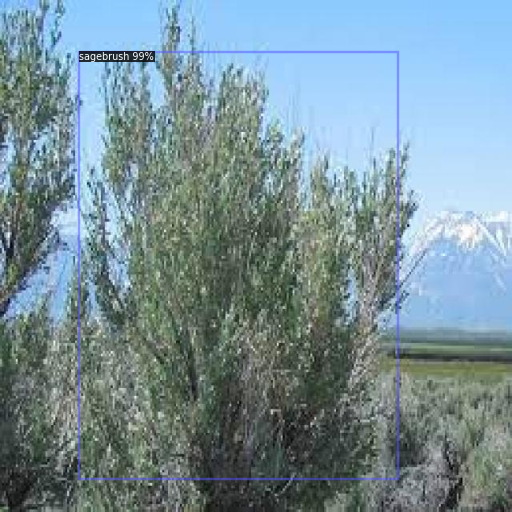

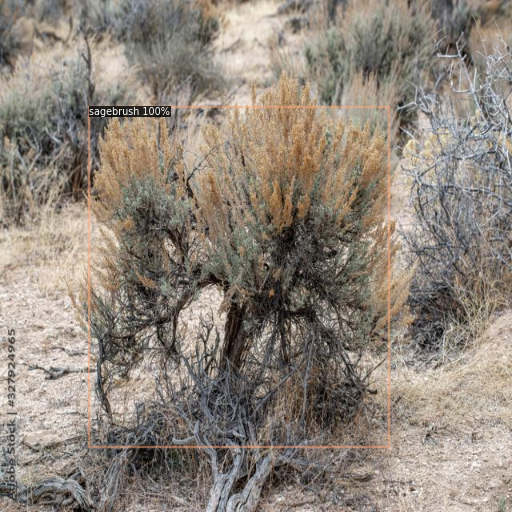

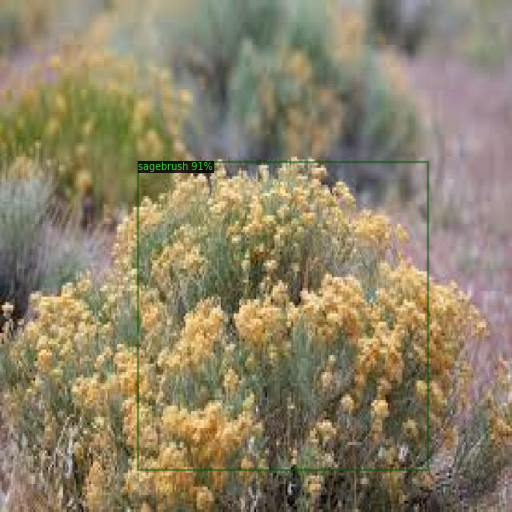

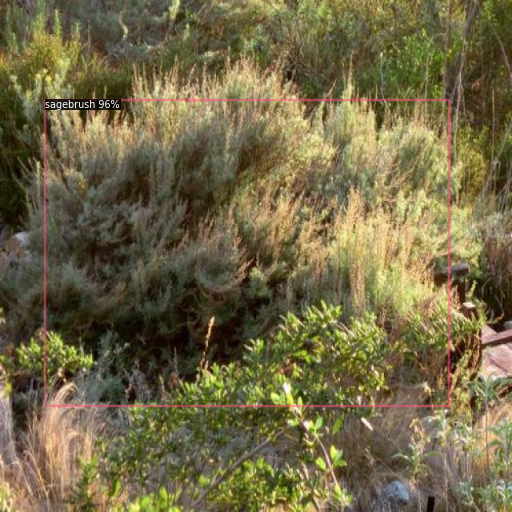

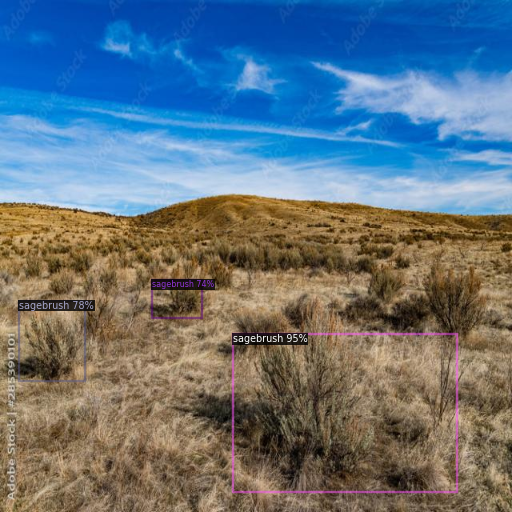

In [13]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
